# Data Loading and EDA

## Loadings

In [1]:
import os
import pandas as pd

# Root directory
train_dir = "/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train"
test_dir = "/kaggle/input/datasets/puneet6060/intel-image-classification/seg_test/seg_test"

# Function to convert image directory into dataframe
def create_image_dataframe(directory):
    data = []

    # Loop through each class folder
    for label in os.listdir(directory):
        label_path = os.path.join(directory, label)

        # Check if it is a folder
        if os.path.isdir(label_path):

            # Loop through images
            for image_name in os.listdir(label_path):
                image_path = os.path.join(label_path, image_name)

                data.append({
                    "image_path": image_path,
                    "label": label
                })

    # Create dataframe
    df = pd.DataFrame(data)

    return df

# Create train dataframe
train_df = create_image_dataframe(train_dir)

# Create test dataframe
test_df = create_image_dataframe(test_dir)

# Display result
print(train_df.head())
print()
print(train_df.shape)

print()
print(test_df.head())
print()
print(test_df.shape)

                                          image_path     label
0  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
1  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
2  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
3  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
4  /kaggle/input/datasets/puneet6060/intel-image-...  mountain

(14034, 2)

                                          image_path     label
0  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
1  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
2  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
3  /kaggle/input/datasets/puneet6060/intel-image-...  mountain
4  /kaggle/input/datasets/puneet6060/intel-image-...  mountain

(3000, 2)


In [2]:
train_df['label'].value_counts(), test_df['label'].value_counts()

(label
 mountain     2512
 glacier      2404
 street       2382
 sea          2274
 forest       2271
 buildings    2191
 Name: count, dtype: int64,
 label
 glacier      553
 mountain     525
 sea          510
 street       501
 forest       474
 buildings    437
 Name: count, dtype: int64)

## Train EDAs

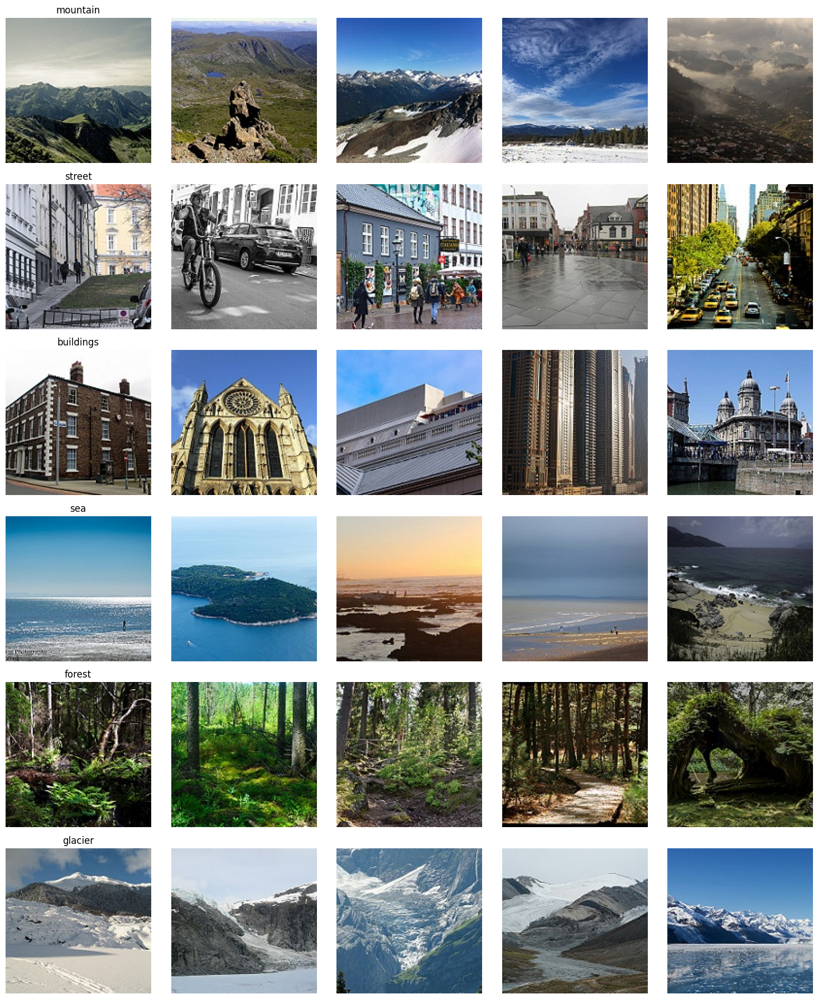

In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import random

# Get unique classes
classes = train_df["label"].unique()

# Create figure
fig, axes = plt.subplots(len(classes), 5, figsize=(15, 18))

# Loop through each class
for row, label in enumerate(classes):

    # Get all images from the class
    class_images = train_df[train_df["label"] == label]["image_path"].tolist()

    # Randomly select 5 images
    sample_images = random.sample(class_images, 5)

    # Plot images
    for col, img_path in enumerate(sample_images):

        img = Image.open(img_path)

        axes[row, col].imshow(img)
        axes[row, col].axis("off")

        # Put class name on first column
        if col == 0:
            axes[row, col].set_title(label, fontsize=12)

plt.tight_layout()
plt.show()

In [4]:
import os
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm

train_dir = "/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train"

def collect_image_info(root_directory, sample_size_per_class=None):

    data = []

    # Loop through each class folder
    for label in os.listdir(root_directory):

        class_dir = os.path.join(root_directory, label)

        # Skip if not directory
        if not os.path.isdir(class_dir):
            continue

        # Get image files
        files = [
            f for f in os.listdir(class_dir)
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]

        # Random sampling
        if sample_size_per_class is not None and sample_size_per_class < len(files):
            files = np.random.choice(
                files,
                sample_size_per_class,
                replace=False
            )

        # Analyze images
        for file in tqdm(files, desc=f"Analyzing {label}"):

            path = os.path.join(class_dir, file)

            try:
                with Image.open(path) as img:

                    w, h = img.size

                    data.append({
                        "label": label,
                        "image_path": path,
                        "width": w,
                        "height": h,
                        "aspect_ratio": w / h,
                        "file_size_kb": os.path.getsize(path) / 1024,
                        "mode": img.mode
                    })

            except:
                continue

    return pd.DataFrame(data)

# Run
df_all = collect_image_info(
    train_dir,
    sample_size_per_class=None  # set None to use all images
)

# Summary statistics
print("\nSummary Statistics:")
display(df_all.groupby("label").describe().T)

# Preview dataframe
print(df_all.head())

Analyzing glacier: 100%|██████████| 2404/2404 [00:19<00:00, 122.21it/s]



Summary Statistics:


label                 buildings       forest      glacier     mountain  \
width        count  2191.000000  2271.000000  2404.000000  2512.000000   
             mean    150.000000   150.000000   150.000000   150.000000   
             std       0.000000     0.000000     0.000000     0.000000   
             min     150.000000   150.000000   150.000000   150.000000   
             25%     150.000000   150.000000   150.000000   150.000000   
             50%     150.000000   150.000000   150.000000   150.000000   
             75%     150.000000   150.000000   150.000000   150.000000   
             max     150.000000   150.000000   150.000000   150.000000   
height       count  2191.000000  2271.000000  2404.000000  2512.000000   
             mean    149.988133   149.894760   149.785358   149.863854   
             std       0.555459     1.897813     3.016617     2.264423   
             min     124.000000   108.000000    76.000000    81.000000   
             25%     150.000000   150.000000   150.000000   150.000000   
             50%     150.000000   150.000000   150.000000   150.000000   
             75%     150.000000   150.000000   150.000000   150.000000   
             max     150.000000   150.000000   150.000000   150.000000   
aspect_ratio count  2191.000000  2271.000000  2404.000000  2512.000000   
             mean      1.000096     1.000915     1.002054     1.001261   
             std       0.004480     0.016881     0.031310     0.023688   
             min       1.000000     1.000000     1.000000     1.000000   
             25%       1.000000     1.000000     1.000000     1.000000   
             50%       1.000000     1.000000     1.000000     1.000000   
             75%       1.000000     1.000000     1.000000     1.000000   
             max       1.209677     1.388889     1.973684     1.851852   
file_size_kb count  2191.000000  2271.000000  2404.000000  2512.000000   
             mean     15.238635    19.872660    13.744434    12.495993   
             std       2.788247     2.650691     2.818868     3.195895   
             min       6.196289     6.200195     5.064453     3.266602   
             25%      13.414551    18.552734    11.770508    10.278564   
             50%      15.240234    20.257812    13.679688    12.507812   
             75%      17.103516    21.646973    15.638672    14.795166   
             max      24.999023    26.485352    23.358398    23.787109   

label                       sea       street  
width        count  2274.000000  2382.000000  
             mean    150.000000   150.000000  
             std       0.000000     0.000000  
             min     150.000000   150.000000  
             25%     150.000000   150.000000  
             50%     150.000000   150.000000  
             75%     150.000000   150.000000  
             max     150.000000   150.000000  
height       count  2274.000000  2382.000000  
             mean    149.946790   149.984467  
             std       1.359421     0.758108  
             min     113.000000   113.000000  
             25%     150.000000   150.000000  
             50%     150.000000   150.000000  
             75%     150.000000   150.000000  
             max     150.000000   150.000000  
aspect_ratio count  2274.000000  2382.000000  
             mean      1.000463     1.000137  
             std       0.011981     0.006709  
             min       1.000000     1.000000  
             25%       1.000000     1.000000  
             50%       1.000000     1.000000  
             75%       1.000000     1.000000  
             max       1.327434     1.327434  
file_size_kb count  2274.000000  2382.000000  
             mean     12.143005    15.668937  
             std       3.228649     2.515005  
             min       4.231445     6.893555  
             25%       9.874512    14.078125  
             50%      11.799805    15.745605  
             75%      14.105713    17.415771  
             max      23.398438    23.754883

      label                                         image_path  width  height  \
0  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
1  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
2  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
3  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
4  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   

   aspect_ratio  file_size_kb mode  
0           1.0      5.458984  RGB  
1           1.0     14.530273  RGB  
2           1.0     13.712891  RGB  
3           1.0      9.942383  RGB  
4           1.0      8.263672  RGB  


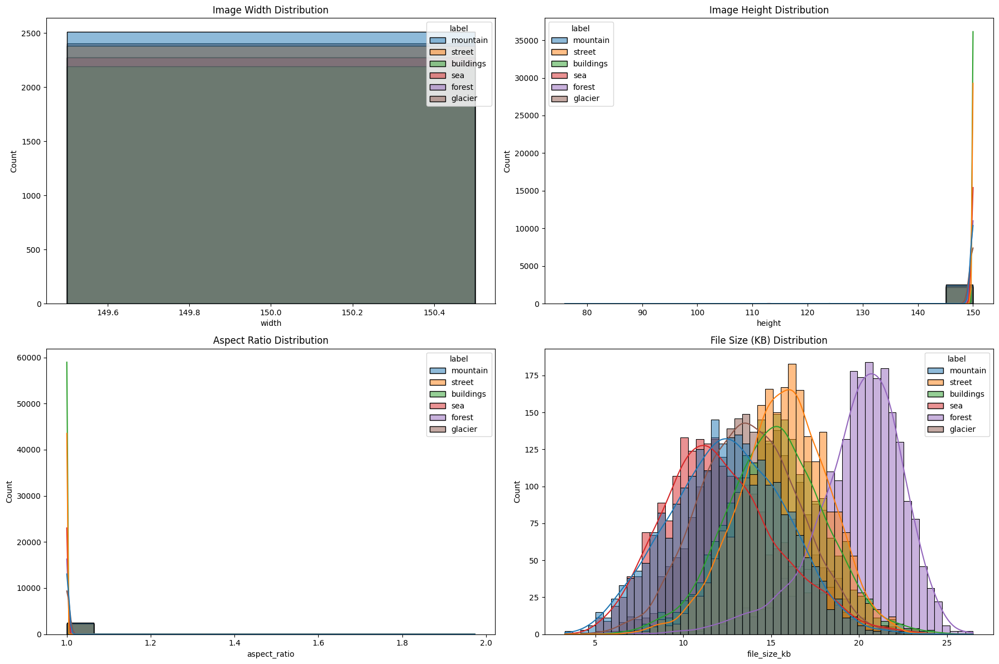

In [5]:
import seaborn as sns

if 'df_all' in locals() and not df_all.empty:
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))

    # Width
    sns.histplot(data=df_all, x='width', hue='label', kde=True, ax=axes[0, 0])
    axes[0, 0].set_title('Image Width Distribution')

    # Height
    sns.histplot(data=df_all, x='height', hue='label', kde=True, ax=axes[0, 1])
    axes[0, 1].set_title('Image Height Distribution')

    # Aspect Ratio
    sns.histplot(data=df_all, x='aspect_ratio', hue='label', kde=True, ax=axes[1, 0])
    axes[1, 0].set_title('Aspect Ratio Distribution')

    # File Size
    sns.histplot(data=df_all, x='file_size_kb', hue='label', kde=True, ax=axes[1, 1])
    axes[1, 1].set_title('File Size (KB) Distribution')

    plt.tight_layout()
    plt.show()
else:
    print("Dataframe kosong, tidak bisa plot.")

In [6]:
df_all.groupby("label")[["width", "height"]].value_counts()

label      width  height
buildings  150    150       2190
                  124          1
forest     150    150       2263
                  108          2
                  113          2
                  115          1
                  133          1
                  135          1
                  136          1
glacier    150    150       2387
                  111          3
                  76           1
                  97           1
                  102          1
                  105          1
                  110          1
                  119          1
                  120          1
                  123          1
                  134          1
                  135          1
                  142          1
                  143          1
                  146          1
                  149          1
mountain   150    150       2495
                  144          2
                  81           1
                  100          1
                  

There are several image that had different resolutions in train data.

## Test EDAs

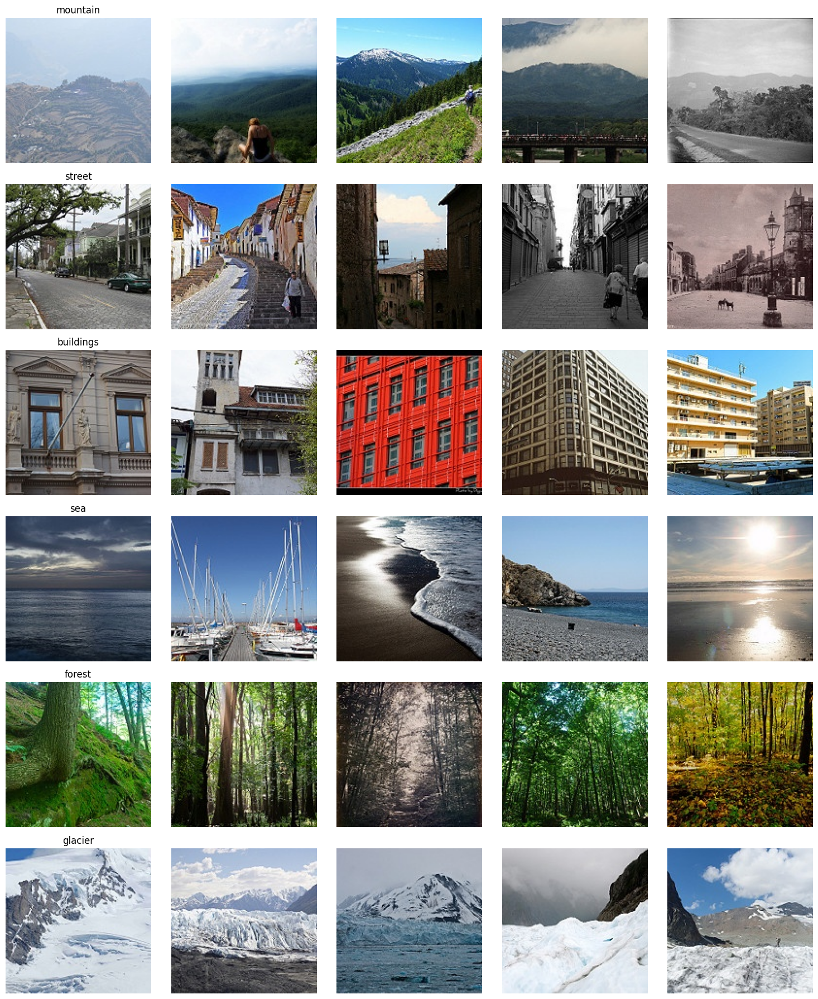

In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import random

# Get unique classes
classes = test_df["label"].unique()

# Create figure
fig, axes = plt.subplots(len(classes), 5, figsize=(15, 18))

# Loop through each class
for row, label in enumerate(classes):

    # Get all images from the class
    class_images = test_df[test_df["label"] == label]["image_path"].tolist()

    # Randomly select 5 images
    sample_images = random.sample(class_images, 5)

    # Plot images
    for col, img_path in enumerate(sample_images):

        img = Image.open(img_path)

        axes[row, col].imshow(img)
        axes[row, col].axis("off")

        # Put class name on first column
        if col == 0:
            axes[row, col].set_title(label, fontsize=12)

plt.tight_layout()
plt.show()

In [8]:
# Run
df_all_test = collect_image_info(
    test_dir,
    sample_size_per_class=None  # set None to use all images
)

# Summary statistics
print("\nSummary Statistics:")
display(df_all_test.groupby("label").describe().T)

# Preview dataframe
print(df_all_test.head())

Analyzing glacier: 100%|██████████| 553/553 [00:04<00:00, 116.07it/s]


Summary Statistics:


label                buildings      forest     glacier    mountain  \
width        count  437.000000  474.000000  553.000000  525.000000   
             mean   150.000000  150.000000  150.000000  150.000000   
             std      0.000000    0.000000    0.000000    0.000000   
             min    150.000000  150.000000  150.000000  150.000000   
             25%    150.000000  150.000000  150.000000  150.000000   
             50%    150.000000  150.000000  150.000000  150.000000   
             75%    150.000000  150.000000  150.000000  150.000000   
             max    150.000000  150.000000  150.000000  150.000000   
height       count  437.000000  474.000000  553.000000  525.000000   
             mean   150.000000  149.981013  149.650995  149.832381   
             std      0.000000    0.413384    4.870356    3.121964   
             min    150.000000  141.000000   72.000000   81.000000   
             25%    150.000000  150.000000  150.000000  150.000000   
             50%    150.000000  150.000000  150.000000  150.000000   
             75%    150.000000  150.000000  150.000000  150.000000   
             max    150.000000  150.000000  150.000000  150.000000   
aspect_ratio count  437.000000  474.000000  553.000000  525.000000   
             mean     1.000000    1.000135    1.004389    1.001899   
             std      0.000000    0.002932    0.063749    0.037701   
             min      1.000000    1.000000    1.000000    1.000000   
             25%      1.000000    1.000000    1.000000    1.000000   
             50%      1.000000    1.000000    1.000000    1.000000   
             75%      1.000000    1.000000    1.000000    1.000000   
             max      1.000000    1.063830    2.083333    1.851852   
file_size_kb count  437.000000  474.000000  553.000000  525.000000   
             mean    15.241696   19.822892   13.648822   12.753501   
             std      2.783803    2.689108    2.830442    3.151917   
             min      8.495117    9.465820    5.943359    4.488281   
             25%     13.269531   18.429199   11.723633   10.356445   
             50%     15.185547   20.258789   13.570312   12.545898   
             75%     17.221680   21.684326   15.619141   14.977539   
             max     23.533203   27.270508   21.735352   21.847656   

label                      sea      street  
width        count  510.000000  501.000000  
             mean   150.000000  150.000000  
             std      0.000000    0.000000  
             min    150.000000  150.000000  
             25%    150.000000  150.000000  
             50%    150.000000  150.000000  
             75%    150.000000  150.000000  
             max    150.000000  150.000000  
height       count  510.000000  501.000000  
             mean   150.000000  150.000000  
             std      0.000000    0.000000  
             min    150.000000  150.000000  
             25%    150.000000  150.000000  
             50%    150.000000  150.000000  
             75%    150.000000  150.000000  
             max    150.000000  150.000000  
aspect_ratio count  510.000000  501.000000  
             mean     1.000000    1.000000  
             std      0.000000    0.000000  
             min      1.000000    1.000000  
             25%      1.000000    1.000000  
             50%      1.000000    1.000000  
             75%      1.000000    1.000000  
             max      1.000000    1.000000  
file_size_kb count  510.000000  501.000000  
             mean    12.189089   15.574180  
             std      3.279001    2.615453  
             min      2.860352    6.283203  
             25%      9.878662   13.960938  
             50%     11.835938   15.504883  
             75%     14.373779   17.392578  
             max     22.013672   22.033203

      label                                         image_path  width  height  \
0  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
1  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
2  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
3  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   
4  mountain  /kaggle/input/datasets/puneet6060/intel-image-...    150     150   

   aspect_ratio  file_size_kb mode  
0           1.0     14.413086  RGB  
1           1.0     10.718750  RGB  
2           1.0     19.217773  RGB  
3           1.0      4.791016  RGB  
4           1.0     10.772461  RGB  


In [9]:
df_all_test.groupby("label")[["width", "height"]].value_counts()

label      width  height
buildings  150    150       437
forest     150    150       473
                  141         1
glacier    150    150       549
                  72          1
                  76          1
                  110         1
                  149         1
mountain   150    150       523
                  81          1
                  131         1
sea        150    150       510
street     150    150       501
Name: count, dtype: int64

Same as train, there are also several image that had different resolutions.

## Splitting Train to get Validation Split

In [10]:
from sklearn.model_selection import train_test_split

df_train, df_val = train_test_split(
    train_df,
    test_size=0.2,
    stratify=train_df["label"],
    random_state=42
)

df_train.shape, df_val.shape

((11227, 2), (2807, 2))

# Preprocessing and Model Training

Combining preprocessing and model training into one section because each model has its own unique preprocessing step.

## CNN2D

### Preprocessing

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (150, 150)
BATCH_SIZE = 128

# Training augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    zoom_range=0.25,

    width_shift_range=0.15,
    height_shift_range=0.15,

    shear_range=0.15,

    horizontal_flip=True,

    brightness_range=[0.7,1.3],

    fill_mode='nearest'
)

# Validation/Test preprocessing only
val_datagen = ImageDataGenerator(
    rescale=1./255
)

test_datagen = ImageDataGenerator(
    rescale=1./255
)

In [19]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=True,
    seed=42
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)


test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)

Found 11227 validated image filenames belonging to 6 classes.
Found 2807 validated image filenames belonging to 6 classes.
Found 3000 validated image filenames belonging to 6 classes.


In [20]:
print("\nClass Indices:")
print(train_generator.class_indices)


Class Indices:
{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


### Model Training

In [21]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D,
    Flatten,
    Dense,
    Dropout,
    BatchNormalization,
    GlobalAveragePooling2D
)
from tensorflow.keras.callbacks import EarlyStopping

#Model
cnn_model = Sequential([

    # =========================
    # Block 1
    # =========================
    Conv2D(
        32,
        (3,3),
        padding='same',
        activation='relu',
        input_shape=(150,150,3)
    ),
    BatchNormalization(),

    MaxPooling2D((2,2)),
    Dropout(0.25),

    # =========================
    # Block 2
    # =========================
    Conv2D(
        64,
        (3,3),
        padding='same',
        activation='relu'
    ),
    BatchNormalization(),

    MaxPooling2D((2,2)),
    Dropout(0.25),

    # =========================
    # Block 3
    # =========================
    Conv2D(
        128,
        (3,3),
        padding='same',
        activation='relu'
    ),
    BatchNormalization(),

    MaxPooling2D((2,2)),
    Dropout(0.30),

    # =========================
    # Classifier
    # =========================
    GlobalAveragePooling2D(),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.50),

    Dense(6, activation='softmax')
])

# COMPILE MODEL
cnn_model.compile(
    optimizer='AdamW',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

cnn_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,734 (506.77 KB)

 Trainable params: 128,774 (503.02 KB)

 Non-trainable params: 960 (3.75 KB)

In [22]:
# Callbacks
early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True
)

#Training
cnn_history = cnn_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=[early_stop]
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.4137 - loss: 1.7035 - val_accuracy: 0.1621 - val_loss: 2.3779
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.5892 - loss: 1.1227 - val_accuracy: 0.1621 - val_loss: 3.4909
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.6294 - loss: 0.9842 - val_accuracy: 0.2070 - val_loss: 4.4327
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.6799 - loss: 0.8665 - val_accuracy: 0.2793 - val_loss: 6.6306
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.7144 - loss: 0.7644 - val_accuracy: 0.3057 - val_loss: 6.3834
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 93s 1s/step - accuracy: 0.7461 - loss: 0.7019 - val_accuracy: 0.3249 - val_loss: 3.9391
Epoch 7/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 93s 1s/step - accuracy: 0.7573 - loss: 0.6567 - val_accuracy: 0.4507 - val_loss: 2.8260
Epoch 8/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 94s 1s/step - accuracy: 0.7578 - loss: 0.6607 - val_accuracy: 0.5668 - val_loss

### Evaluation

In [23]:
# EVALUATION
test_loss, test_acc = cnn_model.evaluate(test_generator)

print("\nTest Loss     :", test_loss)
print("Test Accuracy :", test_acc)

24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 461ms/step - accuracy: 0.7206 - loss: 0.9403

Test Loss     : 0.6890602111816406
Test Accuracy : 0.7953333258628845


In [31]:
import numpy as np
from sklearn.metrics import classification_report

cnn_y_pred_prob = cnn_model.predict(test_generator)
cnn_y_pred = np.argmax(cnn_y_pred_prob, axis=1)

y_true = test_generator.classes
class_names = list(test_generator.class_indices.keys())

report = classification_report(
    y_true,
    cnn_y_pred,
    target_names=class_names
)

print(report)

24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 423ms/step
              precision    recall  f1-score   support

   buildings       0.84      0.75      0.79       437
      forest       0.90      0.99      0.94       474
     glacier       0.67      0.87      0.76       553
    mountain       0.83      0.65      0.73       525
         sea       0.73      0.82      0.77       510
      street       0.89      0.70      0.79       501

    accuracy                           0.80      3000
   macro avg       0.81      0.80      0.80      3000
weighted avg       0.81      0.80      0.79      3000



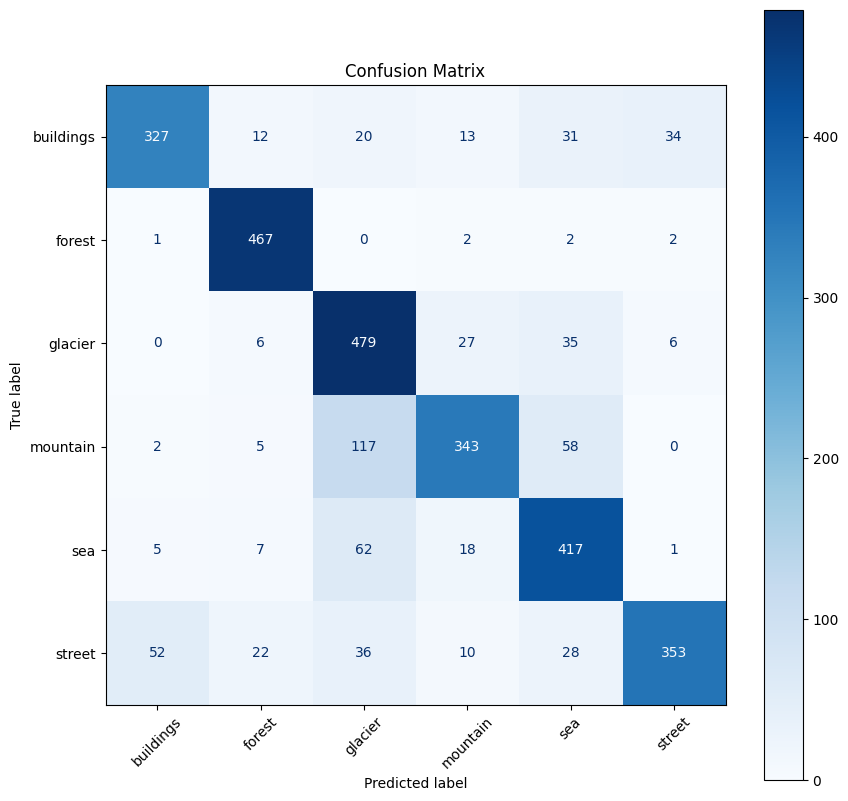

In [32]:
import matplotlib.pyplot as plt

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay
)

cm = confusion_matrix(y_true, cnn_y_pred)

fig, ax = plt.subplots(figsize=(10,10))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    cmap="Blues",
    ax=ax,
    xticks_rotation=45
)

plt.title("Confusion Matrix")

plt.show()

## EfficientNet

### Preprocessing

In [26]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

IMG_SIZE = (150, 150)
BATCH_SIZE = 128

# ============================================
# TRAIN
# ============================================

train_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input,
    rotation_range=25,
    zoom_range=0.25,

    width_shift_range=0.15,
    height_shift_range=0.15,

    shear_range=0.15,

    horizontal_flip=True,

    brightness_range=[0.7,1.3],

    fill_mode='nearest'
)

# ============================================
# VALIDATION
# ============================================

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# ============================================
# TEST
# ============================================

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [27]:
efnet_train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=True,
    seed=42
)

efnet_val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)


efnet_test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)

Found 11227 validated image filenames belonging to 6 classes.
Found 2807 validated image filenames belonging to 6 classes.
Found 3000 validated image filenames belonging to 6 classes.


### Model Training

In [28]:
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    Conv2D,
    BatchNormalization,
    MaxPooling2D
)

# ============================================
# PRETRAINED BACKBONE
# ============================================

base_model = EfficientNetB3(
    weights='imagenet',
    include_top=False,
    input_shape=(150,150,3)
)

# Freeze pretrained weights
base_model.trainable = False

# ============================================
# CUSTOM MODEL
# ============================================

efnet_model = Sequential([

    base_model,
    
    BatchNormalization(),

    GlobalAveragePooling2D(),

    Dense(256, activation='relu'),

    Dense(6, activation='softmax')
])

# COMPILE MODEL
efnet_model.compile(
    optimizer='AdamW',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


efnet_model.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 5, 5, 1536)     │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 5, 5, 1536)     │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       393,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,184,693 (42.67 MB)

 Trainable params: 398,086 (1.52 MB)

 Non-trainable params: 10,786,607 (41.15 MB)

In [29]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Callbacks
early_stop2 = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True
)

#Training
efnet_history = efnet_model.fit(
    efnet_train_generator,
    validation_data=efnet_val_generator,
    epochs=50,
    callbacks=[early_stop2]
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50


2026-05-12 12:33:15.783507: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:33:15.948579: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:33:16.470346: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:33:16.622877: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:33:17.490871: E external/local_xla/xla/stream_

86/88 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.8004 - loss: 0.5641

2026-05-12 12:35:14.095632: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:14.247682: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:14.702097: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:14.850055: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:15.680534: E external/local_xla/xla/stream_

88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8017 - loss: 0.5605

2026-05-12 12:35:58.300051: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:58.463168: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:58.994478: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:59.145222: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:35:59.994225: E external/local_xla/xla/stream_

88/88 ━━━━━━━━━━━━━━━━━━━━ 204s 2s/step - accuracy: 0.8023 - loss: 0.5587 - val_accuracy: 0.9099 - val_loss: 0.2694
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.8935 - loss: 0.2801 - val_accuracy: 0.9074 - val_loss: 0.2500
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.9020 - loss: 0.2620 - val_accuracy: 0.9202 - val_loss: 0.2326
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.9057 - loss: 0.2436 - val_accuracy: 0.9038 - val_loss: 0.2636
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.9092 - loss: 0.2368 - val_accuracy: 0.9127 - val_loss: 0.2346
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.9129 - loss: 0.2182 - val_accuracy: 0.9152 - val_loss: 0.2329
Epoch 7/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.9222 - loss: 0.2051 - val_accuracy: 0.9202 - val_loss: 0.2405
Epoch 8/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.9218 - loss: 0.1982 - val_accuracy: 0.9127 - val_loss: 0.2416


### Evaluation

In [33]:
# EVALUATION
test_loss, test_acc = efnet_model.evaluate(efnet_test_generator)

print("\nTest Loss     :", test_loss)
print("Test Accuracy :", test_acc)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.9085 - loss: 0.2504

2026-05-12 12:53:38.296517: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:53:38.437323: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:53:38.811772: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:53:38.959754: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-12 12:53:39.781430: E external/local_xla/xla/stream_

24/24 ━━━━━━━━━━━━━━━━━━━━ 22s 945ms/step - accuracy: 0.9092 - loss: 0.2495

Test Loss     : 0.23942966759204865
Test Accuracy : 0.9173333048820496


In [35]:
import numpy as np
from sklearn.metrics import classification_report

efnet_y_pred_prob = efnet_model.predict(efnet_test_generator)
efnet_y_pred = np.argmax(efnet_y_pred_prob, axis=1)

y_true = efnet_test_generator.classes
class_names = list(efnet_test_generator.class_indices.keys())

report = classification_report(
    y_true,
    efnet_y_pred,
    target_names=class_names
)

print(report)

24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 751ms/step
              precision    recall  f1-score   support

   buildings       0.91      0.92      0.92       437
      forest       1.00      0.99      0.99       474
     glacier       0.88      0.83      0.85       553
    mountain       0.87      0.88      0.88       525
         sea       0.93      0.97      0.95       510
      street       0.92      0.93      0.93       501

    accuracy                           0.92      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.92      0.92      0.92      3000



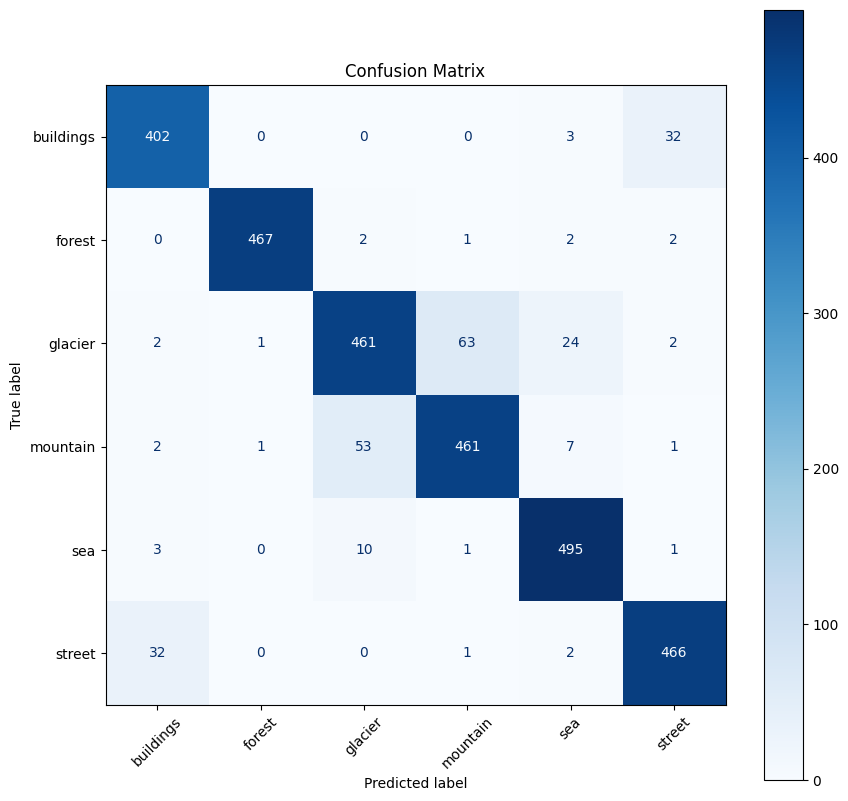

In [36]:
import matplotlib.pyplot as plt

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay
)

cm = confusion_matrix(y_true, efnet_y_pred)

fig, ax = plt.subplots(figsize=(10,10))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    cmap="Blues",
    ax=ax,
    xticks_rotation=45
)

plt.title("Confusion Matrix")

plt.show()

## ResNet

### Preprocessing

In [42]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input

IMG_SIZE = (224, 224)
BATCH_SIZE = 128

# ============================================
# TRAIN
# ============================================

train_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input,
    rotation_range=25,
    zoom_range=0.25,

    width_shift_range=0.15,
    height_shift_range=0.15,

    shear_range=0.15,

    horizontal_flip=True,

    brightness_range=[0.7,1.3],

    fill_mode='nearest'
)

# ============================================
# VALIDATION
# ============================================

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# ============================================
# TEST
# ============================================

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [43]:
resnet_train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=True,
    seed=42
)

resnet_val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)


resnet_test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="image_path",
    y_col="label",

    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,

    class_mode="categorical",

    shuffle=False
)

Found 11227 validated image filenames belonging to 6 classes.
Found 2807 validated image filenames belonging to 6 classes.
Found 3000 validated image filenames belonging to 6 classes.


### Model Training

In [44]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    BatchNormalization
)

# ============================================
# PRETRAINED BACKBONE
# ============================================

base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

# Freeze pretrained weights
base_model.trainable = False

# ============================================
# CUSTOM MODEL
# ============================================

resnet_model = Sequential([

    base_model,

    BatchNormalization(),

    GlobalAveragePooling2D(),

    Dense(
        512,
        activation='mish'
    ),
    BatchNormalization(),
    Dropout(0.5),

    Dense(
        256,
        activation='mish'
    ),
    BatchNormalization(),
    Dropout(0.4),

    Dense(6, activation='softmax')
])

# ============================================
# COMPILE MODEL
# ============================================

resnet_model.compile(
    optimizer="AdamW",
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ============================================
# SUMMARY
# ============================================

resnet_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 7, 7, 2048)     │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,780,934 (94.53 MB)

 Trainable params: 1,187,590 (4.53 MB)

 Non-trainable params: 23,593,344 (90.00 MB)

In [45]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

#Training
resnet_history = resnet_model.fit(
    resnet_train_generator,
    validation_data=resnet_val_generator,
    epochs=50,
    callbacks=[early_stop2]
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 248s 2s/step - accuracy: 0.7644 - loss: 0.7451 - val_accuracy: 0.9177 - val_loss: 0.2418
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 190s 2s/step - accuracy: 0.8808 - loss: 0.3439 - val_accuracy: 0.9209 - val_loss: 0.2443
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 190s 2s/step - accuracy: 0.8926 - loss: 0.3008 - val_accuracy: 0.9223 - val_loss: 0.2362
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.9034 - loss: 0.2654 - val_accuracy: 0.9234 - val_loss: 0.2276
Epoch 5/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.9127 - loss: 0.2511 - val_accuracy: 0.9302 - val_loss: 0.2187
Epoch 6/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.9180 - loss: 0.2247 - val_accuracy: 0.9327 - val_loss: 0.2206
Epoch 7/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9140 - loss: 0.2270 - val_accuracy: 0.9273 - val_loss: 0.2167
Epoch 8/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.9165 - loss: 0.2241 - val_accuracy: 0.9280 - v

### Evaluation

In [46]:
# EVALUATION
test_loss, test_acc = resnet_model.evaluate(resnet_test_generator)

print("\nTest Loss     :", test_loss)
print("Test Accuracy :", test_acc)

24/24 ━━━━━━━━━━━━━━━━━━━━ 22s 935ms/step - accuracy: 0.9111 - loss: 0.2422

Test Loss     : 0.20389923453330994
Test Accuracy : 0.9266666769981384


In [47]:

import numpy as np
from sklearn.metrics import classification_report

resnet_y_pred_prob = resnet_model.predict(resnet_test_generator)
resnet_y_pred = np.argmax(resnet_y_pred_prob, axis=1)

y_true = resnet_test_generator.classes
class_names = list(resnet_test_generator.class_indices.keys())

report = classification_report(
    y_true,
    resnet_y_pred,
    target_names=class_names
)

print(report)

24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 598ms/step
              precision    recall  f1-score   support

   buildings       0.95      0.91      0.93       437
      forest       0.98      1.00      0.99       474
     glacier       0.90      0.86      0.88       553
    mountain       0.89      0.86      0.88       525
         sea       0.93      0.98      0.96       510
      street       0.92      0.96      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



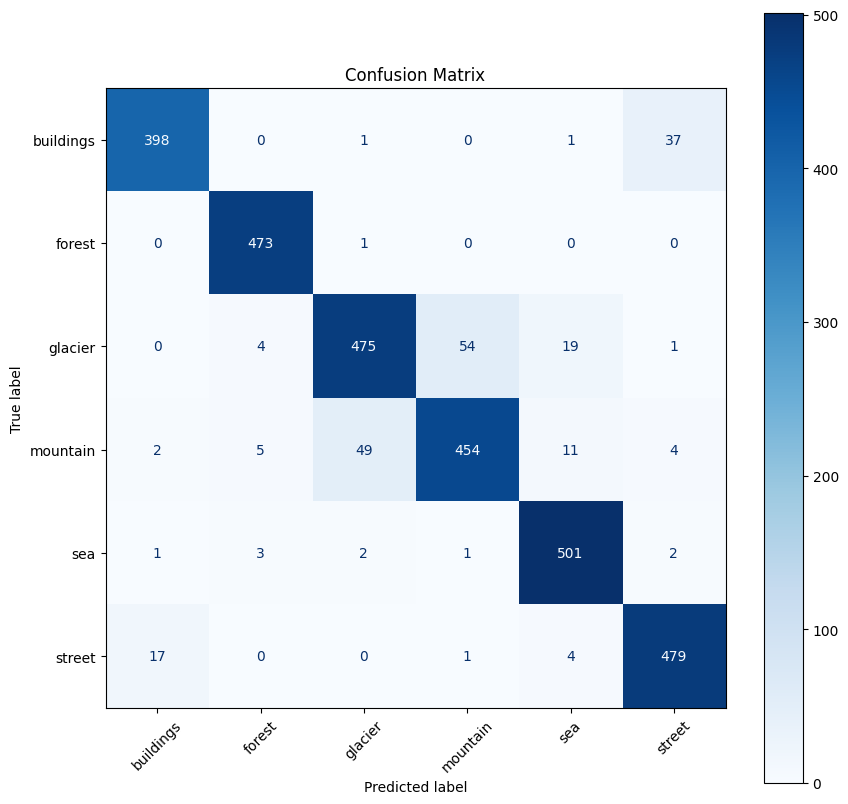

In [48]:
import matplotlib.pyplot as plt

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay
)

cm = confusion_matrix(y_true, resnet_y_pred)

fig, ax = plt.subplots(figsize=(10,10))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    cmap="Blues",
    ax=ax,
    xticks_rotation=45
)

plt.title("Confusion Matrix")

plt.show()

# Model Evaluation and Comparison

## Training Plot

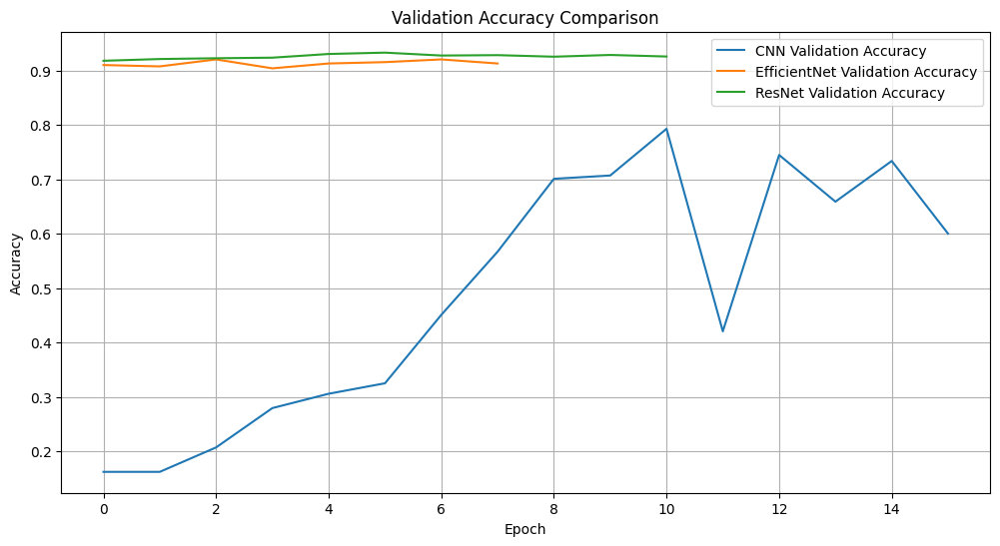

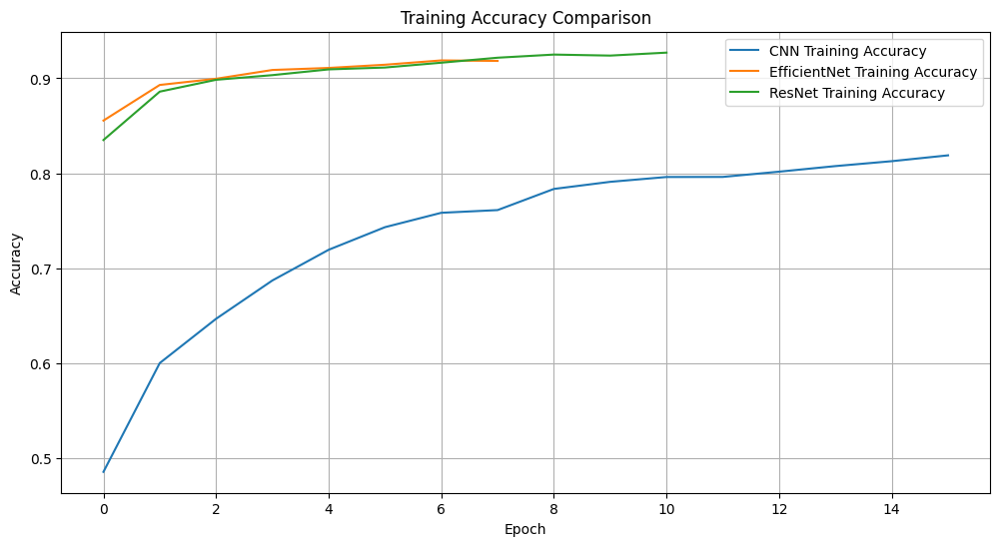

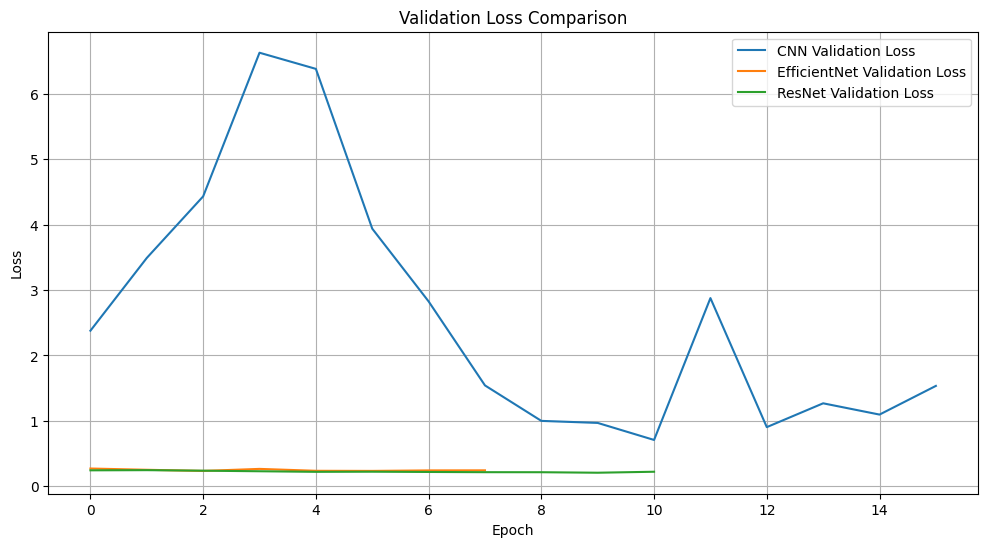

In [49]:
import matplotlib.pyplot as plt

# ============================================
# ACCURACY COMPARISON
# ============================================

plt.figure(figsize=(12,6))

# CNN
plt.plot(
    cnn_history.history['val_accuracy'],
    label='CNN Validation Accuracy'
)

# EfficientNet
plt.plot(
    efnet_history.history['val_accuracy'],
    label='EfficientNet Validation Accuracy'
)

# ResNet
plt.plot(
    resnet_history.history['val_accuracy'],
    label='ResNet Validation Accuracy'
)

plt.title('Validation Accuracy Comparison')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.legend()

plt.grid(True)

plt.show()


# ============================================
# TRAINING ACCURACY COMPARISON
# ============================================

plt.figure(figsize=(12,6))

# CNN
plt.plot(
    cnn_history.history['accuracy'],
    label='CNN Training Accuracy'
)

# EfficientNet
plt.plot(
    efnet_history.history['accuracy'],
    label='EfficientNet Training Accuracy'
)

# ResNet
plt.plot(
    resnet_history.history['accuracy'],
    label='ResNet Training Accuracy'
)

plt.title('Training Accuracy Comparison')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.legend()

plt.grid(True)

plt.show()


# ============================================
# LOSS COMPARISON
# ============================================

plt.figure(figsize=(12,6))

# CNN
plt.plot(
    cnn_history.history['val_loss'],
    label='CNN Validation Loss'
)

# EfficientNet
plt.plot(
    efnet_history.history['val_loss'],
    label='EfficientNet Validation Loss'
)

# ResNet
plt.plot(
    resnet_history.history['val_loss'],
    label='ResNet Validation Loss'
)

plt.title('Validation Loss Comparison')

plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.legend()

plt.grid(True)

plt.show()

## Metrics Comparison

In [52]:
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score
)

# True Labels
y_true = test_generator.classes


# Metrics Function
def evaluate_model(y_true, y_pred):

    return {
        'Accuracy': accuracy_score(y_true, y_pred),

        'Balanced Accuracy': balanced_accuracy_score(
            y_true,
            y_pred
        ),

        'Precision (Weighted)': precision_score(
            y_true,
            y_pred,
            average='weighted'
        ),

        'Recall (Weighted)': recall_score(
            y_true,
            y_pred,
            average='weighted'
        ),

        'F1-Score (Weighted)': f1_score(
            y_true,
            y_pred,
            average='weighted'
        )
    }

# Create comparison table
comparison_df = pd.DataFrame({

    'CNN': evaluate_model(
        y_true,
        cnn_y_pred
    ),

    'EfficientNetB3': evaluate_model(
        y_true,
        efnet_y_pred
    ),

    'ResNet50': evaluate_model(
        y_true,
        resnet_y_pred
    )

}).T

comparison_df = comparison_df.round(4)
comparison_df

,Accuracy,Balanced Accuracy,Precision (Weighted),Recall (Weighted),F1-Score (Weighted)
CNN,0.7953,0.7959,0.8073,0.7953,0.7942
EfficientNetB3,0.9173,0.9196,0.9170,0.9173,0.9170
ResNet50,0.9267,0.9285,0.9263,0.9267,0.9261


ResNet perform the best though not so significant compared to the EfficientNet

In [56]:
resnet_model.save('resnet_model.keras')

# Inference using Best Model

In [57]:
import tensorflow as t
loaded_model = tf.keras.models.load_model(
    "resnet_model.keras"
)

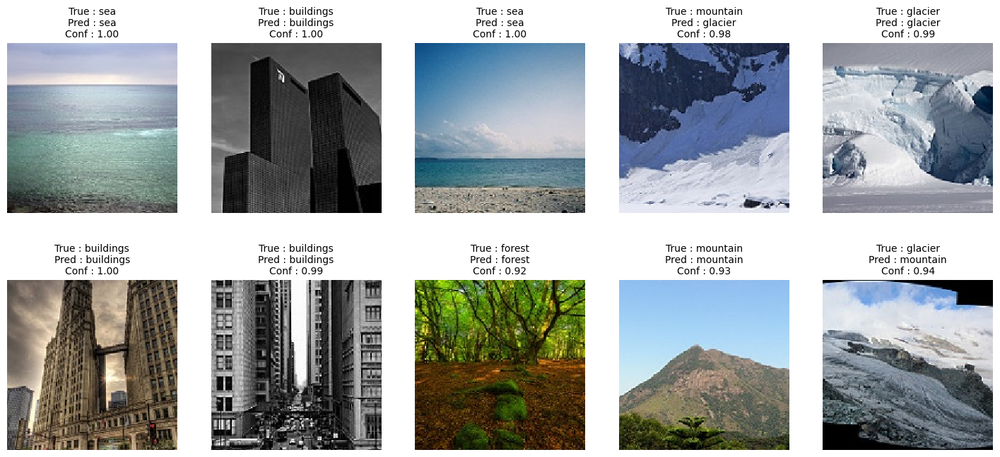

In [58]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

from tensorflow.keras.applications.efficientnet import (
    preprocess_input
)

# ============================================
# CLASS NAMES
# ============================================

class_names = list(
    resnet_train_generator.class_indices.keys()
)

# ============================================
# SAMPLE 10 TEST IMAGES
# ============================================

sample_df = test_df.sample(
    10,
    random_state=42
).reset_index(drop=True)

# ============================================
# CREATE FIGURE
# ============================================

fig, axes = plt.subplots(
    2,
    5,
    figsize=(18,8)
)

axes = axes.flatten()

# ============================================
# INFERENCE LOOP
# ============================================

for i in range(10):

    # Image path
    image_path = sample_df.iloc[i]["image_path"]

    # True label
    true_label = sample_df.iloc[i]["label"]

    # ----------------------------------------
    # LOAD IMAGE
    # ----------------------------------------

    img = load_img(
        image_path,
        target_size=(224,224)
    )

    img_array = img_to_array(img)

    # Save original image for plotting
    display_img = img_array.astype("uint8")

    # ----------------------------------------
    # PREPROCESS
    # ----------------------------------------

    img_array = np.expand_dims(
        img_array,
        axis=0
    )

    img_array = preprocess_input(
        img_array
    )

    # ----------------------------------------
    # PREDICT
    # ----------------------------------------

    prediction = loaded_model.predict(
        img_array,
        verbose=0
    )

    pred_class = np.argmax(prediction)

    confidence = np.max(prediction)

    pred_label = class_names[pred_class]

    # ----------------------------------------
    # PLOT IMAGE
    # ----------------------------------------

    axes[i].imshow(display_img)

    axes[i].axis("off")

    axes[i].set_title(

        f"True : {true_label}\n"
        f"Pred : {pred_label}\n"
        f"Conf : {confidence:.2f}",

        fontsize=10
    )

plt.show()

The overall performance of the trained models is already quite good. However, due to the visual similarity and overlap between certain scene categories, particularly mountain and glacier, as well as building and street, the models may still occasionally misclassify images belonging to these four classes.